In [6]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.image import imread
import time
import glob
from sklearn.preprocessing import StandardScaler

from functions.stats_functions import *

In [2]:
teams_colors = {'France': 'blue',
                'England': 'lightgrey',
                'Scotland': '#2a3f88',
                'Ireland': '#00c8a9',
                'Wales': 'red',
                'Italia': '#2267e8'}

teams_img = {'France': 'img/France.png',
             'England': 'img/England.png',
             'Scotland': 'img/Scotland.png',
             'Ireland': 'img/Ireland.png',
             'Wales': 'img/Wales.png',
             'Italia': 'img/Italia.png'}

games_scores = {'France': {'Ireland': '17 - 38', 'Scotland': '16 - 20', 'Italia': '13 - 13', 'Wales': '24 - 45', 'England': '33 - 31'},
                'England': {'Italia': '24 - 27', 'Wales': '16 - 14', 'Scotland': '30 - 21', 'Ireland': '23 - 22', 'France': '33 - 31'},
                'Scotland': {'Wales': '26 - 27', 'France': '16 - 20', 'England': '30 - 21', 'Italia': '31 - 29', 'Ireland': '17 - 13'},
                'Ireland': {'France': '17 - 38', 'Italia': '36 - 0', 'Wales': '31 - 7', 'England': '23 - 22', 'Scotland': '17 - 13'},
                'Wales': {'Scotland': '26 - 27', 'England': '16 - 14', 'Ireland': '31 - 7', 'France': '24 - 45', 'Italia': '21 - 24'},
                'Italia': {'England': '24 - 27', 'Ireland': '36 - 0', 'France': '13 - 13', 'Scotland': '31 - 29', 'Wales': '21 - 24'}}

In [3]:
data = pd.DataFrame()

all_files = glob.glob('data/*.csv')
for file in all_files:
    round_ = 'R' + str(file.split('_')[0][-2:][1])
    csv_file = pd.read_csv(file, encoding='latin1')
    csv_file['Round'] = round_
    data = pd.concat([data, csv_file], ignore_index=True)

data = data[data['Résultat']!='Supprimer']

data['Dur.'] = [e-s for s, e in zip(data['Start_time'], data['End_time'])]
data.loc[368, 'Dur.'] = 49.96
data.loc[242, 'Dur.'] = 16.78
data['Duration'] = [((time.localtime(t).tm_min*60) + time.localtime(t).tm_sec) if t>0 else 0 for t  in data['Dur.']]
data = data[data['Duration']>0]
data['Durée_timeline'] = [(-d) if p==m.split(' - ')[1] else d for d, p, m in zip(data['Duration'], data['Possession'], data['Match'])]

data.loc[data['End_zone']=='En-but', 'End_zone_value'] = 12

data['Phases'] = data['Ruck'] + data['Ruck +']
data['Passes_total'] = data['Passe'] + data['Offload'] + data['Offload +']

data['Rucks-Passes Ratio'] = round(data['Phases']
                                   / data['Passes_total'], 2)

data.loc[data['Phases']==0, 'Rucks-Passes Ratio'] = data['Passes_total']
data.loc[data['Passes_total']==0, 'Rucks-Passes Ratio'] = 0

data['Play up'] = data['Passe'] + data['Offload'] + data['Offload +']
data['Kicking play'] = data['Dégagement'] + data['Jeu au pied']
data['Progress +'] = data['Ruck +'] + data['Offload +']

data['Progress Ratio'] = round(data['Progress +'] / (data['Ruck']+data['Offload']), 2)
data['Progress Ratio'] = data['Progress Ratio'].fillna(0)
data.loc[data['Progress Ratio']==np.inf, 'Progress Ratio'] = 0

data['Zones Progress'] = data['End_zone_value'] - data['Start_zone_value']

In [4]:
data.columns

Index(['Match', 'Chrono', 'Score_team1', 'Score_team2', 'Possession',
       'Start_type', 'Start_time', 'End_time', 'Start_zone',
       'Start_zone_value', 'End_zone', 'End_zone_value', 'Résultat',
       'Dernière action', 'Passe', 'Ruck', 'Ruck +', 'Offload', 'Offload +',
       'Jeu au pied', 'Maul', 'Relâché', 'Départ ruck', 'Dégagement', 'Round',
       'Dur.', 'Duration', 'Durée_timeline', 'Phases', 'Passes_total',
       'Rucks-Passes Ratio', 'Play up', 'Kicking play', 'Progress +',
       'Progress Ratio', 'Zones Progress'],
      dtype='object')

In [79]:
cols = ['Rucks-Passes Ratio', 'Zones Progress', 'Progress Ratio', 'Progress +']
data_q = data[['Possession']+cols].reset_index(drop=True)

scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(data_q[cols]), columns=[f'scaled {c}' for c in cols])
data_q = pd.concat([data_q, scaled_data], axis=1)
data_q

,Possession,Rucks-Passes Ratio,Zones Progress,Progress Ratio,Progress +,scaled Rucks-Passes Ratio,scaled Zones Progress,scaled Progress Ratio,scaled Progress +
0,France,2.00,4,0.0,0,1.185738,0.921662,-0.582821,-0.764019
1,Ireland,0.40,0,1.0,1,-0.674023,-0.926729,0.509070,-0.211891
2,France,0.50,3,0.0,0,-0.557788,0.459565,-0.582821,-0.764019
3,France,0.17,4,0.0,0,-0.941364,0.921662,-0.582821,-0.764019
4,Ireland,0.33,5,0.0,1,-0.755388,1.383760,-0.582821,-0.211891
...,...,...,...,...,...,...,...,...,...
907,Wales,0.20,1,0.0,1,-0.906493,-0.464631,-0.582821,-0.211891
908,Wales,1.50,0,2.0,4,0.604563,-0.926729,1.600961,1.444493
909,Wales,1.12,1,2.0,6,0.162869,-0.464631,1.600961,2.548749
910,Wales,1.50,9,2.0,4,0.604563,3.232152,1.600961,1.444493


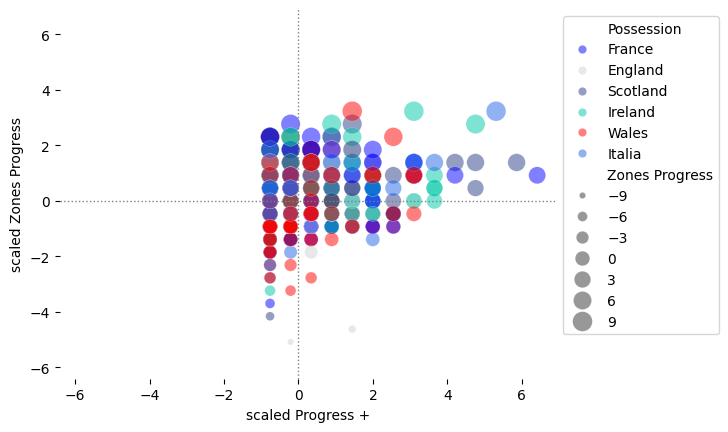

In [85]:
ax = sns.scatterplot(data=data_q, x='scaled Progress +', y='scaled Zones Progress', hue='Possession', hue_order=teams_colors.keys(),
                     palette=teams_colors.values(),
                     size='Zones Progress', sizes=(20, 200),
                     linewidth=.2, alpha=.5)
sns.move_legend(ax, 'upper left', bbox_to_anchor=(1, 1))
plot_lim = np.max([data_q['scaled Progress +'], data_q['scaled Zones Progress']])
plt.xlim((-plot_lim, plot_lim+.5))
plt.ylim((-plot_lim, plot_lim+.5))
plt.axvline(0, color='gray', linestyle=':', linewidth=1)
plt.axhline(0, color='gray', linestyle=':', linewidth=1)
ax.spines[:].set_visible(False)
plt.show()

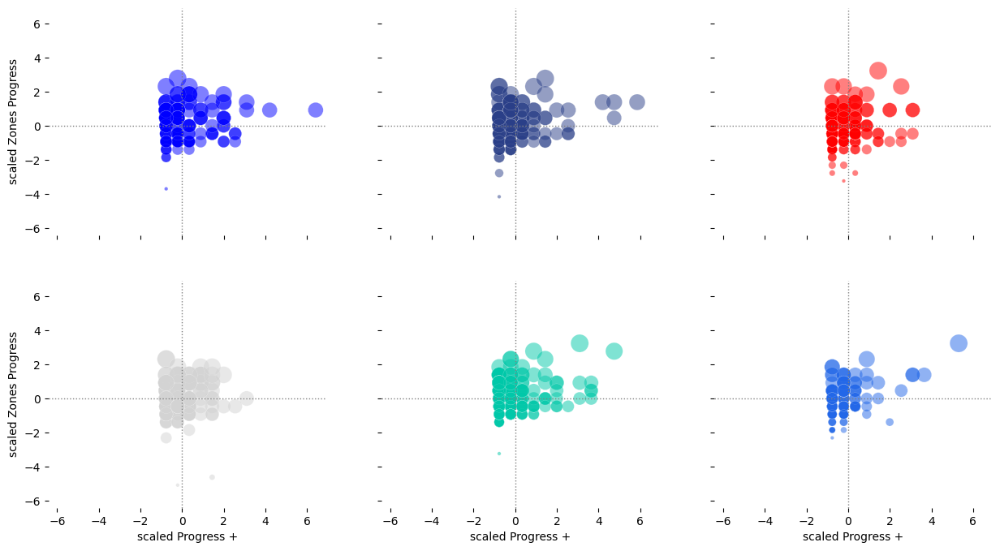

In [82]:
fig, ax = plt.subplots(2, 3, figsize=(15, 8), sharex=True, sharey=True)
plot_lim = np.max([data_q['scaled Progress +'], data_q['scaled Zones Progress']])
plt.xlim((-plot_lim, plot_lim+.5))
plt.ylim((-plot_lim, plot_lim+.5))
ni = 0
ci = 0

for t in teams_colors.keys():
    data_t = data_q[data_q['Possession']==t].copy()
    sns.scatterplot(data=data_t, x='scaled Progress +', y='scaled Zones Progress',
                    color=teams_colors[t],
                    size='Zones Progress', sizes=(10, 250),
                    linewidth=.2, alpha=.5, 
                    ax=ax[ni, ci], legend=False)
    ax[ni, ci].axvline(0, color='gray', linestyle=':', linewidth=1)
    ax[ni, ci].axhline(0, color='gray', linestyle=':', linewidth=1)
    ax[ni, ci].spines[:].set_visible(False)
    ni += 1
    if ni == 2:
        ci += 1
        ni = 0
plt.show()

# Timelines

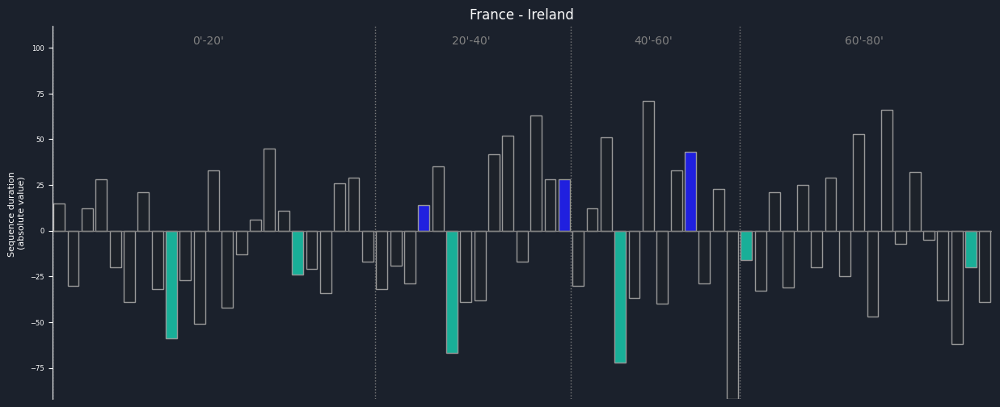

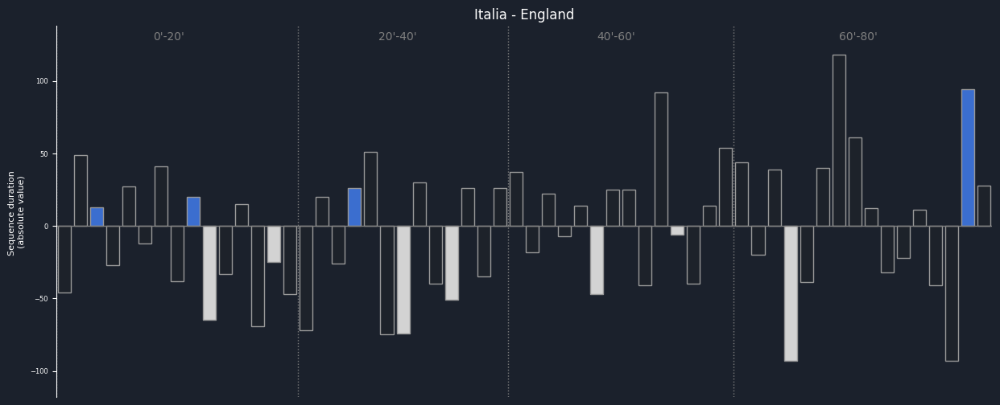

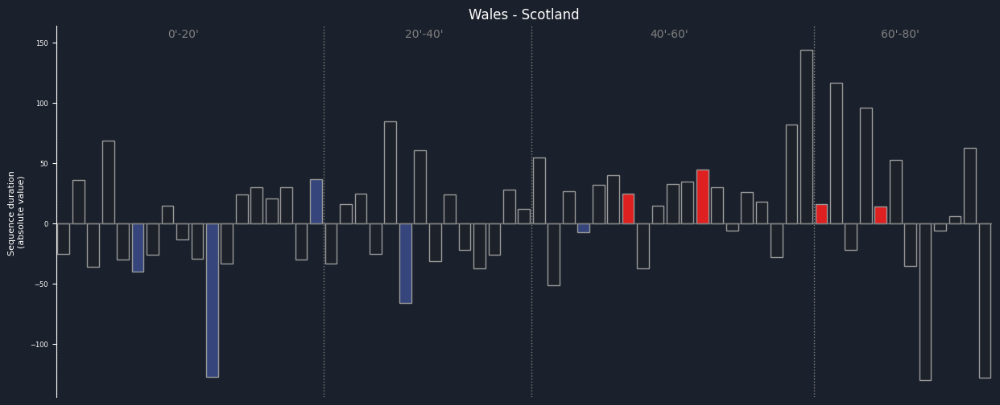

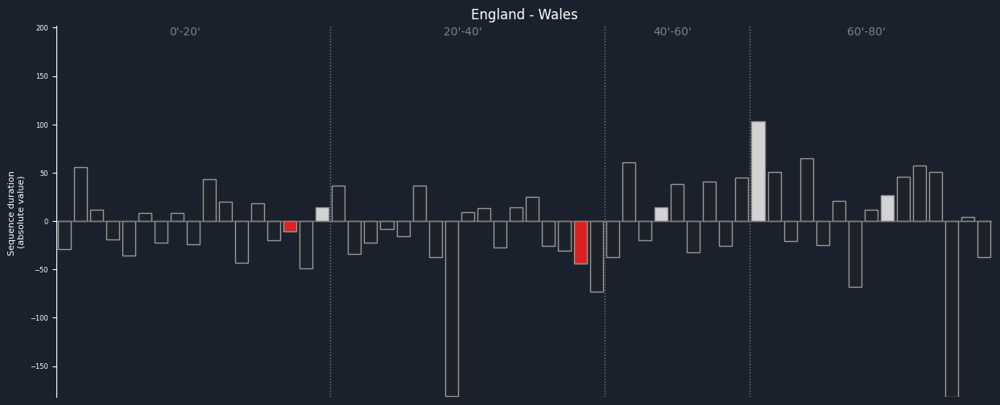

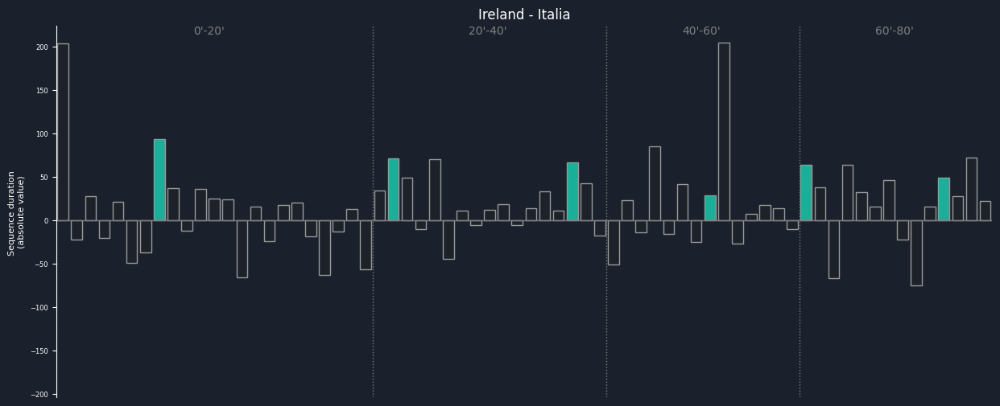

...

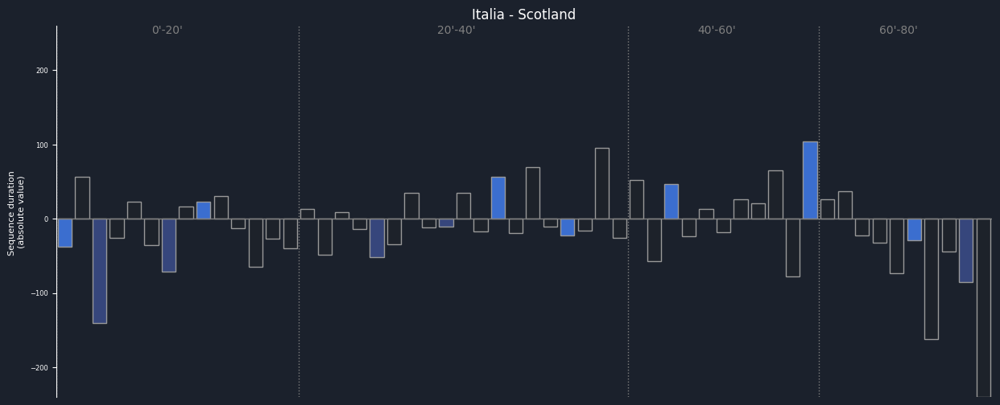

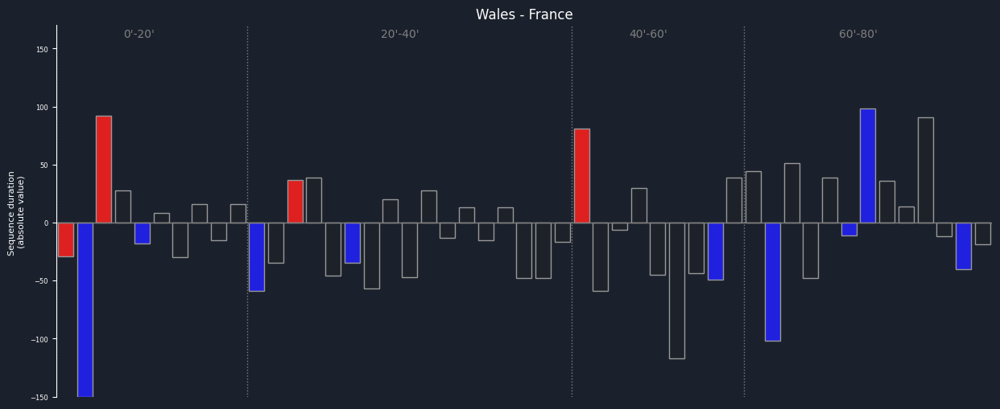

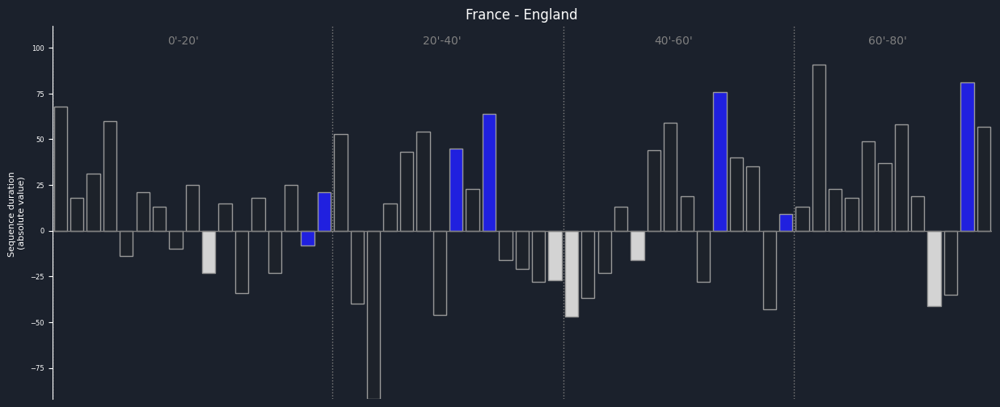

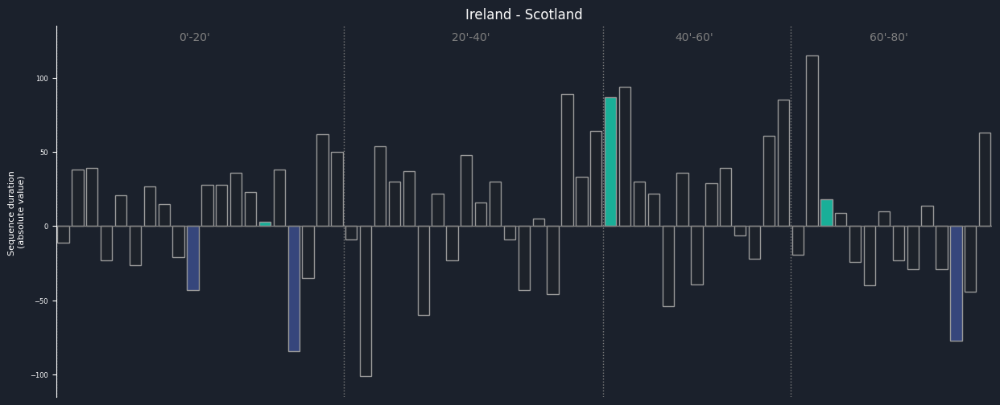

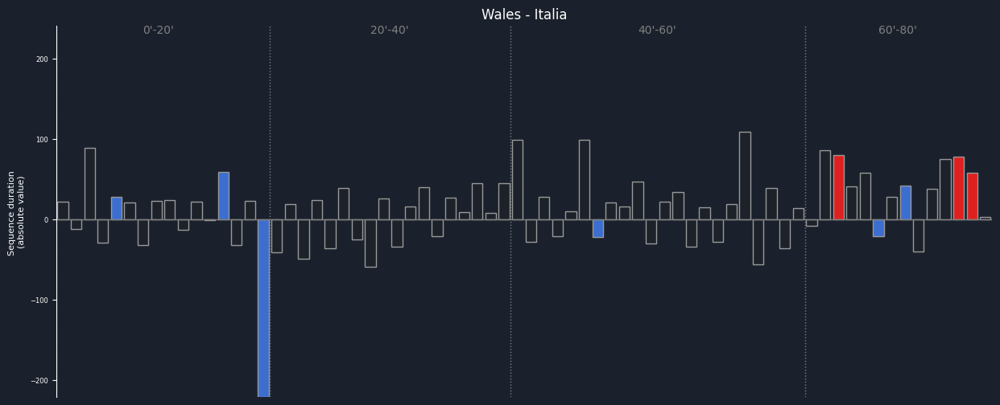

In [5]:
for r in data['Round'].unique():
    data_r = data[data['Round']==r].copy()
    for game in data_r['Match'].unique():
        data_g = data_r[data_r['Match']==game].reset_index(drop=True).copy()
        colors = [teams_colors[game.split(' - ')[0]], teams_colors[game.split(' - ')[1]]]
        
        data_g['Color_timeline'] = [colors[0] if s1<0 else colors[1] if s2<0 else '#1B212C'
                                    for s1, s2 in zip(data_g['Score_team1'].diff(-1), data_g['Score_team2'].diff(-1))]

        fig, ax = plt.subplots(figsize=(15, 6), facecolor='#1B212C')
        sns.barplot(data=data_g, x=data_g.index, y='Durée_timeline', hue=data_g.index, legend=False, ax=ax, edgecolor='.6', palette=list(data_g['Color_timeline']))
        plt.xlabel('')
        plt.ylabel('Sequence duration \n(absolute value)', fontsize=8, color='white')
        ylim_ = np.max(data_g['Duration'])
        plt.ylim((-ylim_, ylim_+20))
        plt.yticks(fontsize=6, color='white')
        plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        ax.tick_params(axis='y', colors='white')
        for c in data_g['Chrono'].unique():
            c_cut = data_g[data_g['Chrono']==c].index[0]
            plt.axvline(c_cut-.5, color='gray', linestyle=':', linewidth=1)
            if c == "0'-20'":
                plt.text(x=(data_g[data_g['Chrono']==c].shape[0]/2)-2, y=ylim_+10, s=c, color='gray')
            else:
                plt.text(x=c_cut+(data_g[data_g['Chrono']==c].shape[0]/2)-2, y=ylim_+10, s=c, color='gray')
        plt.axhline(0, color='gray', linewidth=1)
        ax.set_facecolor('#1B212C')
        ax1 = plt.gca()
        ax1.spines['left'].set_color('white')
        ax1.spines['top'].set_visible(False)
        ax1.spines['bottom'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        plt.title(game, color='white')
        plt.savefig(f'eda_timeline/{r}_{game}.png', bbox_inches='tight')

# Boxplots

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\1672936022.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='#1B212C')


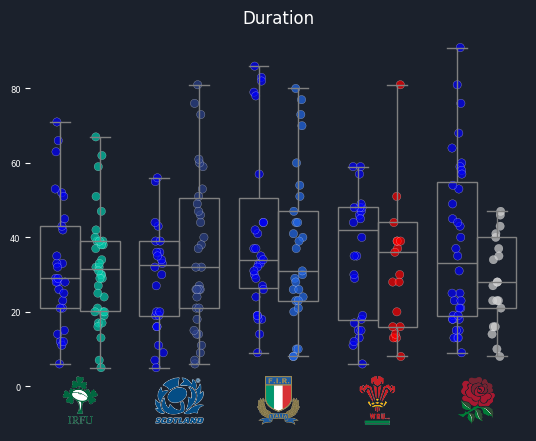

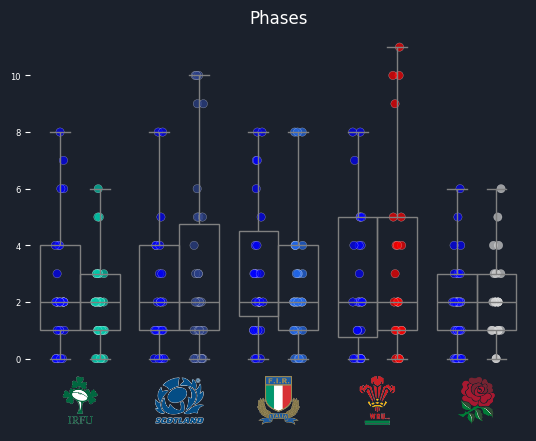

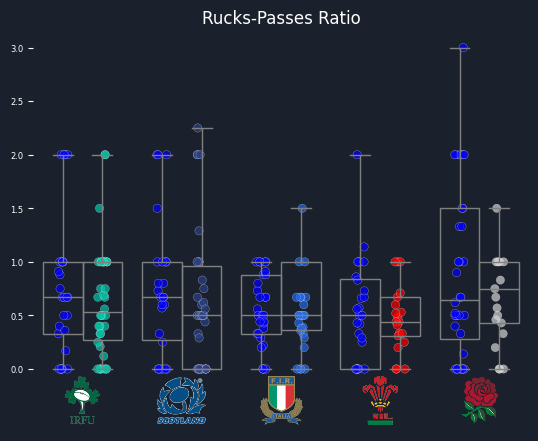

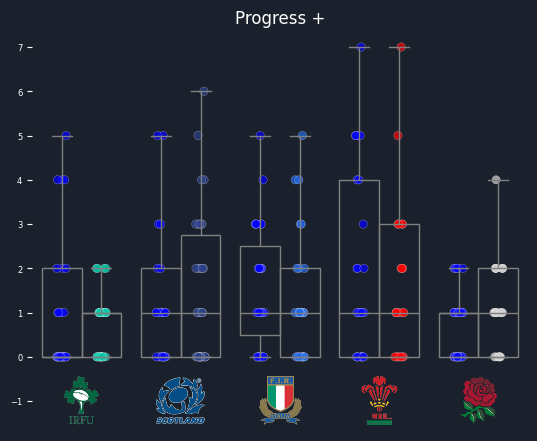

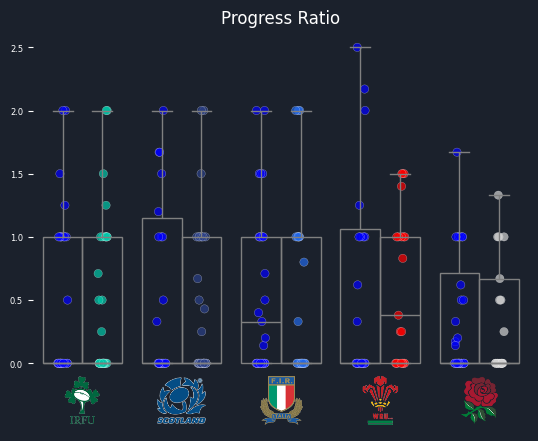

...

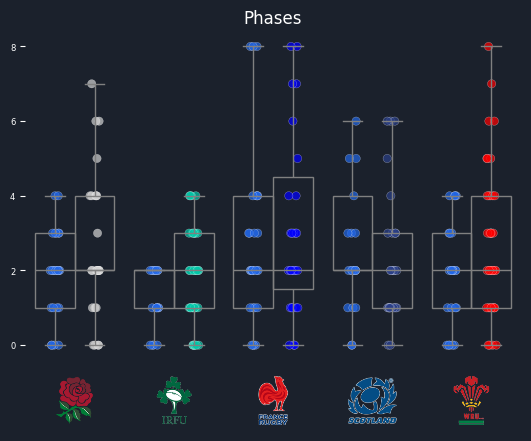

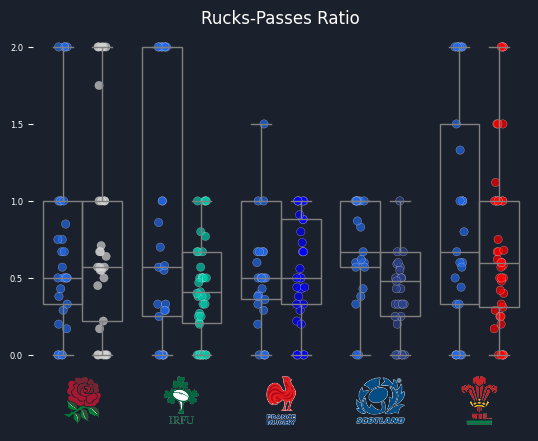

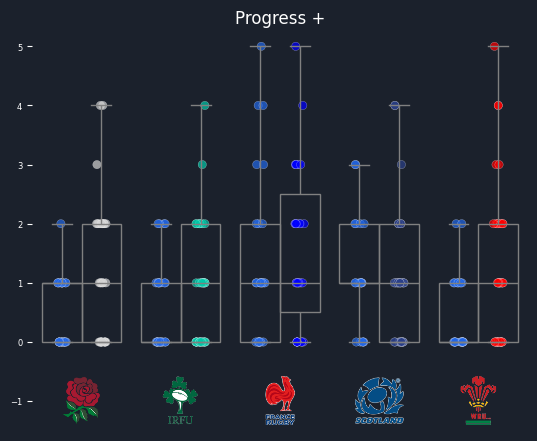

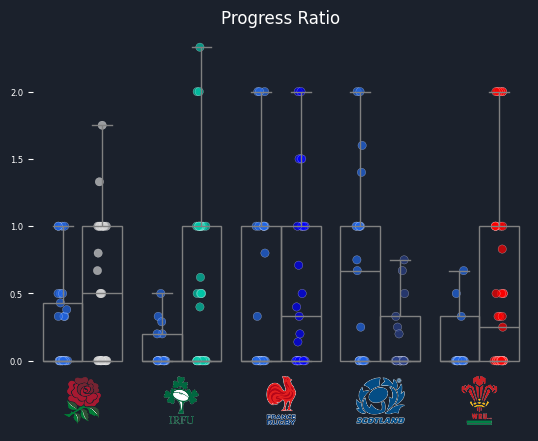

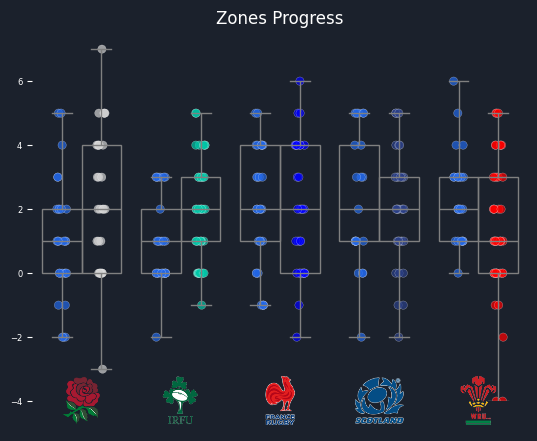

In [7]:
for team in teams_colors.keys():
    data_team = data[data['Match'].str.contains(team)].reset_index(drop=True).copy()
    data_team['Possession plot'] = np.where(data_team['Possession']==team, 'Team', 'Other')

    for metric, ylim in zip(['Duration', 'Phases', 'Rucks-Passes Ratio', 'Progress +', 'Progress Ratio', 'Zones Progress'],
                            [-4, -1.5, -.3, -1, -.3, -4]):

        fig, ax = plt.subplots(facecolor='#1B212C')
        ax.set_facecolor('#1B212C')

        PROPS = {'boxprops':{'facecolor':'none', 'edgecolor':'gray'},
                 'medianprops':{'color':'gray'},
                 'whiskerprops':{'color':'gray'},
                 'capprops':{'color':'gray'}}

        sns.boxplot(data=data_team, x='Round', y=metric, hue='Possession plot',
                    ax=ax, **PROPS, flierprops={'markeredgecolor':'gray'},
                    legend=False, showfliers=False, order=['R1', 'R2', 'R3', 'R4', 'R5'], hue_order=['Team', 'Other'])

        tick_labels = ax.xaxis.get_ticklabels()
        for i, (t, r) in enumerate(zip(games_scores[team].keys(), data_team['Round'].unique())):
            data_t = data_team[(data_team['Round']==r) & (data_team['Possession']!=t)].copy()
            q1_t, q3_t = np.percentile(data_t[metric], [25, 75])
            iqr_t = q3_t - q1_t
            lower_fence_t = q1_t - (1.5*iqr_t)
            higher_fence_t = q3_t + (1.5*iqr_t)
            mask_t = data_t[metric].between(lower_fence_t, higher_fence_t, inclusive='both')
            data_t_iqr = data_t.loc[mask_t]
            
            data_other = data_team[(data_team['Round']==r) & (data_team['Possession']==t)].copy()
            q1_o, q3_o = np.percentile(data_other[metric], [25, 75])
            iqr_o = q3_o - q1_o
            lower_fence_o = q1_o - (1.5*iqr_o)
            higher_fence_o = q3_o + (1.5*iqr_o)
            mask_o = data_other[metric].between(lower_fence_o, higher_fence_o, inclusive='both')
            data_other_iqr = data_other.loc[mask_o]

            data_game = pd.concat([data_t_iqr, data_other_iqr], ignore_index=True)

            sns.stripplot(data=data_game, x='Round', y=metric, hue='Possession plot', 
                          dodge=True,ax=ax, zorder=1, legend=False, alpha=.7, size=6,
                          palette=[teams_colors[team], teams_colors[t]], 
                          linewidth=.2, edgecolor='white', hue_order=['Team', 'Other'])
    
            logo = imread(f'img/{t}.png')
            logobox = OffsetImage(logo, zoom=0.35)
            logobox.image.axes = ax
            ab = AnnotationBbox(logobox, (i, ylim), frameon=False)
            ax.add_artist(ab)

        ax.set_xticklabels([])
        ax.set(xlabel=None, ylabel=None)
        ax.spines[:].set_visible(False)
        ax.tick_params(axis='y', colors='white')
        ax.set_ylim(ylim, None)
        plt.yticks(fontsize=6, color='white')
        plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        plt.title(metric, color='white')
        plt.savefig(f'eda_boxplots/{team}_{metric}.png', bbox_inches='tight')

# Fields

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\296287932.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='green')


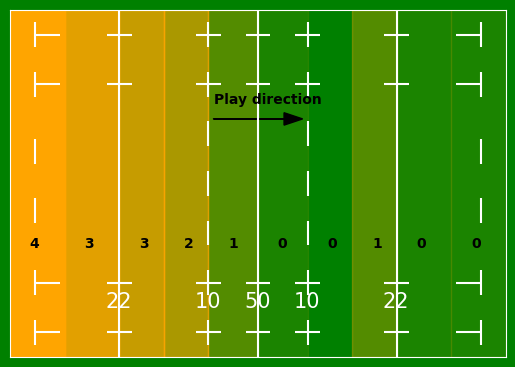

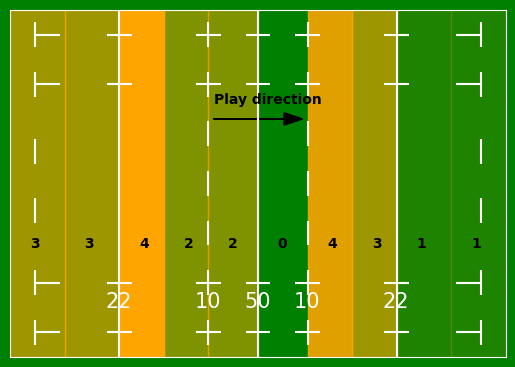

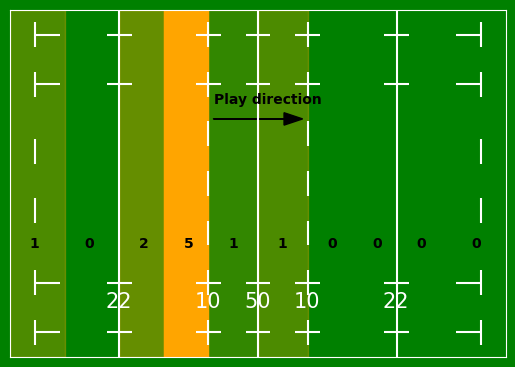

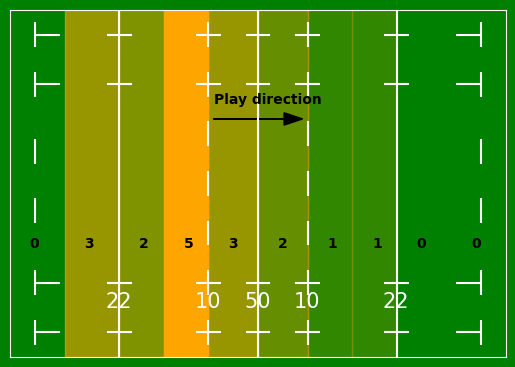

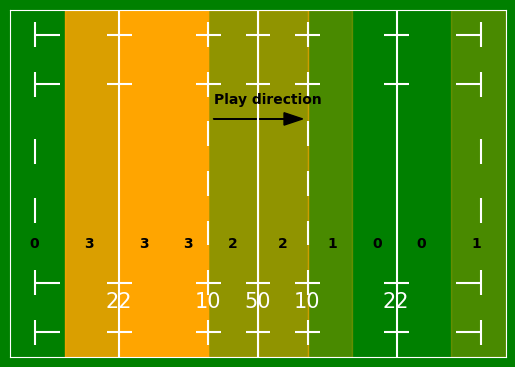

...

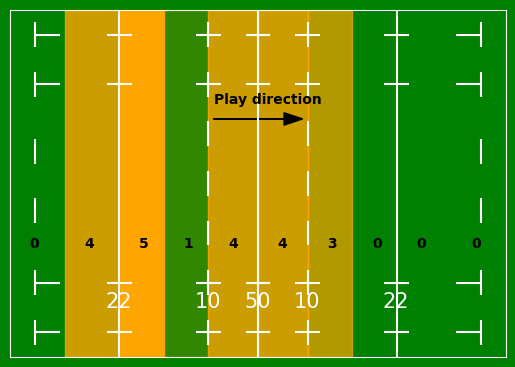

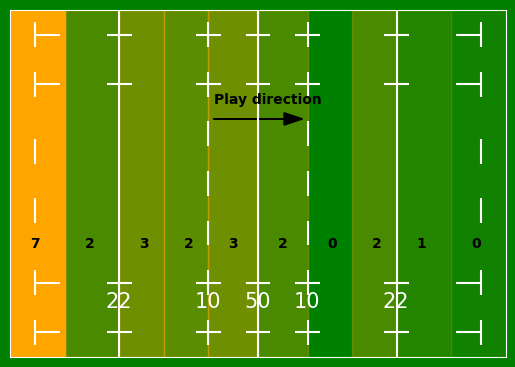

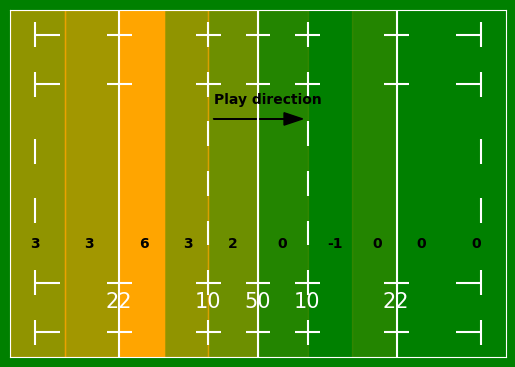

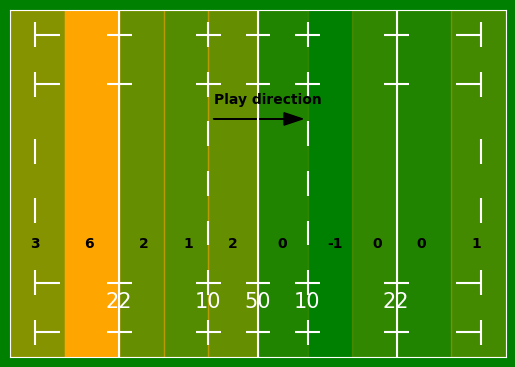

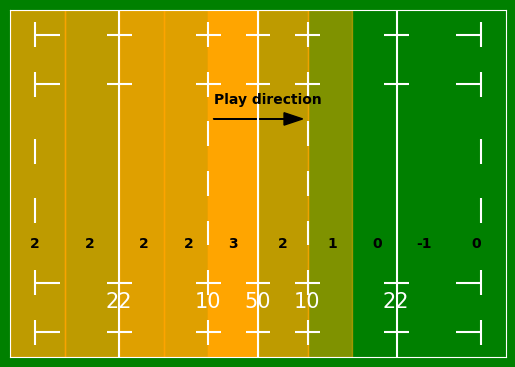

In [8]:
for r in data['Round'].unique():
    data_r = data[data['Round']==r].copy()
    for game in data_r['Match'].unique():
        data_g = data_r[data_r['Match']==game].copy()
        for t in game.split(' - '):
            data_g_t = data_g[data_g['Possession']==t].copy()

            zone_start = data_g_t.groupby('Start_zone')['Zones Progress'].median().to_frame()
            zone_start['PZ_%'] = round((zone_start['Zones Progress']-zone_start['Zones Progress'].min()) 
                                       / (zone_start['Zones Progress'].max()-zone_start['Zones Progress'].min()), 2)

            for z in ['22m1', '22m2', '40m1', '40m2', '10m1', '10m2', '40m3', '40m4', '22m3', '22m4']:
                if z not in zone_start.index.tolist():
                    zone_start.loc[z, ['Zones Progress', 'PZ_%']] = 0, 0 

            fig, ax = plt.subplots(facecolor='green')
            ax.set_aspect('equal')
            ax.set_facecolor('green')
            plt.xlim(0, 100)
            plt.ylim(0, 70)
            for vl in [22, 50, 78]:
                plt.axvline(vl, color='white')

            hl_dict = {22: [19.5, 24.5], 40: [37.5, 42.5], 50: [47.5, 52.5],
                       60: [57.5, 62.5], 78: [75.5, 80.5],
                       5: [5, 10], 95: [90, 95]}

            for hl in hl_dict:
                ax.hlines(55, hl_dict[hl][0], hl_dict[hl][1], color='white')
                ax.hlines(15, hl_dict[hl][0], hl_dict[hl][1], color='white')
                ax.hlines(65, hl_dict[hl][0], hl_dict[hl][1], color='white')
                ax.hlines(5, hl_dict[hl][0], hl_dict[hl][1], color='white')

            for tl in [5, 40, 60, 95]:
                ax.vlines(tl, 52.5, 57.5, color='white')
                ax.vlines(tl, 12.5, 17.5, color='white')
                ax.vlines(tl, 62.5, 67.5, color='white')
                ax.vlines(tl, 2.5, 7.5, color='white')

            for gl in [5, 95]:
                ax.vlines(gl, 27, 32, color='white')
                ax.vlines(gl, 39, 44, color='white')

            for l10 in [40, 60]:
                ax.vlines(l10, 22.5, 27.5, colors='white')
                ax.vlines(l10, 32.5, 37.5, colors='white')
                ax.vlines(l10, 42.5, 47.5, colors='white')

            plt.text(19.2, 10, s='22', fontsize=15, fontweight='medium', color='white')
            plt.text(37.2, 10, s='10', fontsize=15, fontweight='medium', color='white')
            plt.text(47.2, 10, s='50', fontsize=15, fontweight='medium', color='white')
            plt.text(57.2, 10, s='10', fontsize=15, fontweight='medium', color='white')
            plt.text(75.2, 10, s='22', fontsize=15, fontweight='medium', color='white')

            ax1 = plt.gca()
            ax1.spines['left'].set_color('white')
            ax1.spines['top'].set_color('white')
            ax1.spines['bottom'].set_color('white')
            ax1.spines['right'].set_color('white')

            zone_dict = {'22m1': [0, 11, 4], '22m2': [11, 22, 15],
                        '40m1': [22, 31, 26], '40m2': [31, 40, 35],
                        '10m1': [40, 50, 44], '10m2': [50, 60, 54],
                        '40m3': [60, 69, 64], '40m4': [69, 78, 73],
                        '22m3': [78, 89, 82], '22m4': [89, 100, 93]}
    
            for z in zone_dict:
                ax.axvspan(zone_dict[z][0], zone_dict[z][1], color='orange', alpha=zone_start.loc[z, 'PZ_%'])
                plt.text(zone_dict[z][2], 22, s=int(zone_start.loc[z, 'Zones Progress']), color='black', fontweight='bold')

            plt.yticks([])
            plt.xticks([])

            plt.text(41.2, 51, s='Play direction', color='black', fontweight='bold')
            ax.arrow(41, 48, 18, 0, head_width=2.5, length_includes_head=True, color='black')

            plt.savefig(f'eda_fields/{r}_{t}.png', bbox_inches='tight')

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\3793563637.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='green')


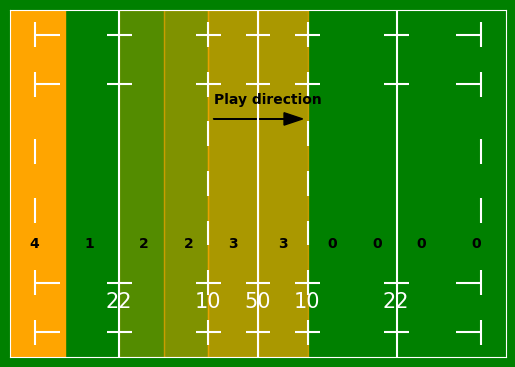

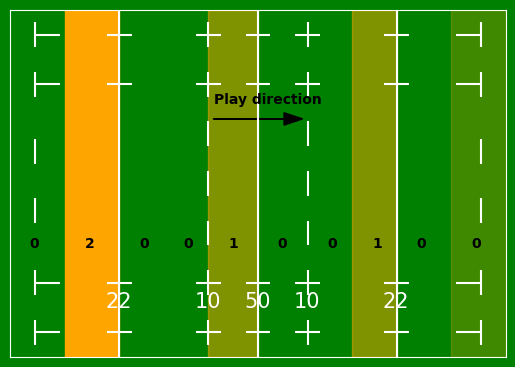

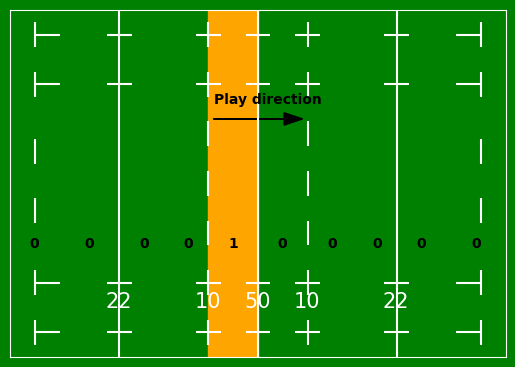

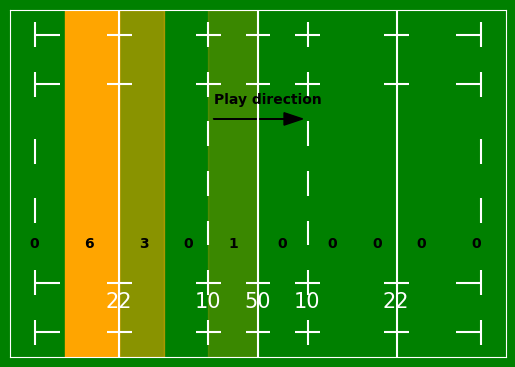

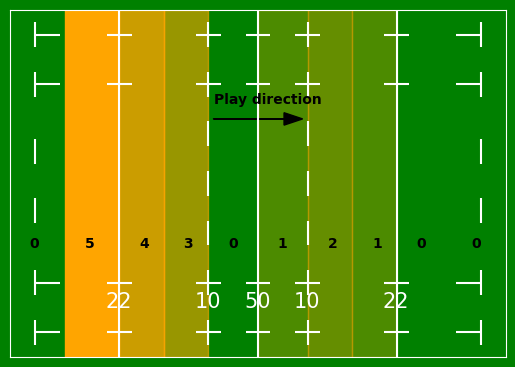

...

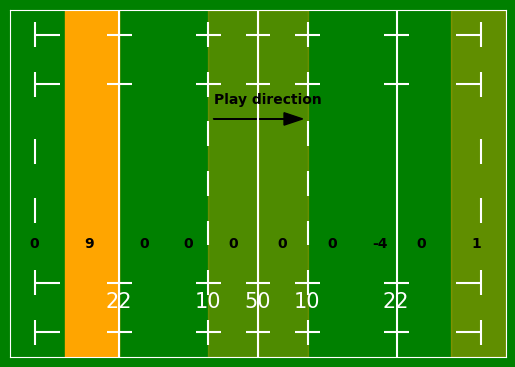

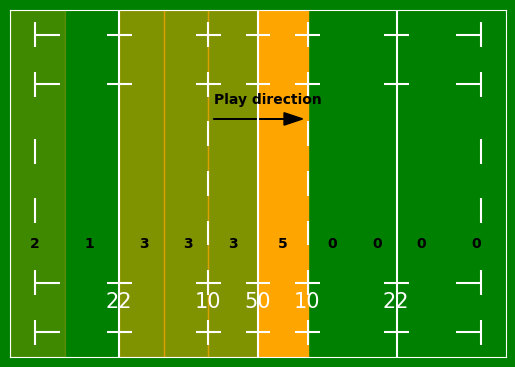

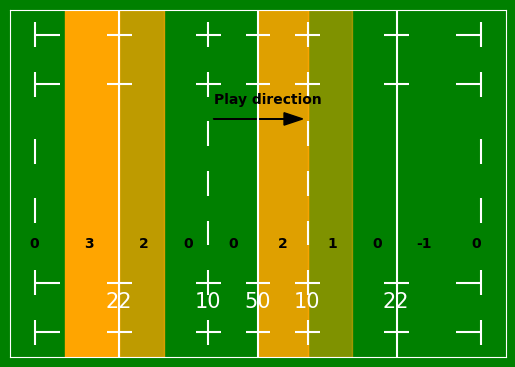

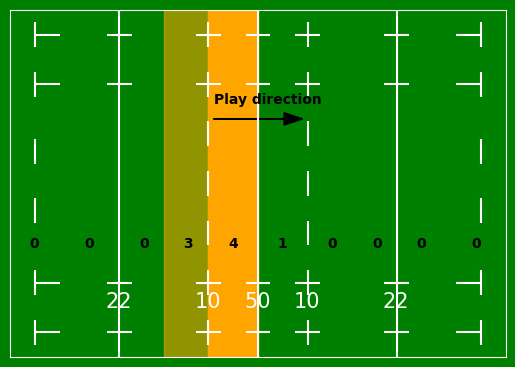

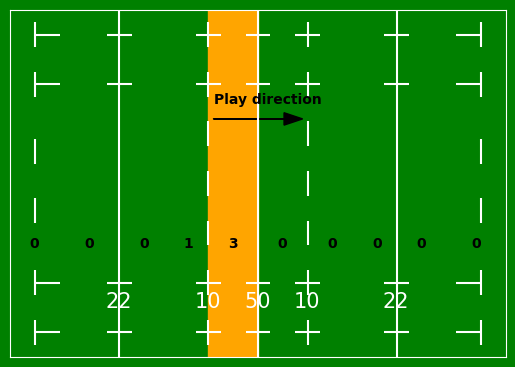

In [9]:
for r in data['Round'].unique():
    data_r = data[data['Round']==r].copy()
    for game in data_r['Match'].unique():
        data_g = data_r[data_r['Match']==game].copy()
        for t in game.split(' - '):
            data_g_t = data_g[data_g['Possession']==t].copy()
            for c in data_g_t['Chrono'].unique():
                data_g_t_c = data_g_t[data_g_t['Chrono']==c].copy()

                zone_start = data_g_t_c.groupby('Start_zone')['Zones Progress'].median().to_frame()
                zone_start['PZ_%'] = round((zone_start['Zones Progress']-zone_start['Zones Progress'].min()) 
                                           / (zone_start['Zones Progress'].max()-zone_start['Zones Progress'].min()), 2)
                zone_start['PZ_%'] = zone_start['PZ_%'].fillna(.5)

                for z in ['22m1', '22m2', '40m1', '40m2', '10m1', '10m2', '40m3', '40m4', '22m3', '22m4']:
                    if z not in zone_start.index.tolist():
                        zone_start.loc[z, ['Zones Progress', 'PZ_%']] = 0, 0 

                fig, ax = plt.subplots(facecolor='green')
                ax.set_aspect('equal')
                ax.set_facecolor('green')
                plt.xlim(0, 100)
                plt.ylim(0, 70)
                for vl in [22, 50, 78]:
                    plt.axvline(vl, color='white')

                hl_dict = {22: [19.5, 24.5], 40: [37.5, 42.5], 50: [47.5, 52.5],
                           60: [57.5, 62.5], 78: [75.5, 80.5],
                           5: [5, 10], 95: [90, 95]}

                for hl in hl_dict:
                    ax.hlines(55, hl_dict[hl][0], hl_dict[hl][1], color='white')
                    ax.hlines(15, hl_dict[hl][0], hl_dict[hl][1], color='white')
                    ax.hlines(65, hl_dict[hl][0], hl_dict[hl][1], color='white')
                    ax.hlines(5, hl_dict[hl][0], hl_dict[hl][1], color='white')

                for tl in [5, 40, 60, 95]:
                    ax.vlines(tl, 52.5, 57.5, color='white')
                    ax.vlines(tl, 12.5, 17.5, color='white')
                    ax.vlines(tl, 62.5, 67.5, color='white')
                    ax.vlines(tl, 2.5, 7.5, color='white')

                for gl in [5, 95]:
                    ax.vlines(gl, 27, 32, color='white')
                    ax.vlines(gl, 39, 44, color='white')

                for l10 in [40, 60]:
                    ax.vlines(l10, 22.5, 27.5, colors='white')
                    ax.vlines(l10, 32.5, 37.5, colors='white')
                    ax.vlines(l10, 42.5, 47.5, colors='white')

                plt.text(19.2, 10, s='22', fontsize=15, fontweight='medium', color='white')
                plt.text(37.2, 10, s='10', fontsize=15, fontweight='medium', color='white')
                plt.text(47.2, 10, s='50', fontsize=15, fontweight='medium', color='white')
                plt.text(57.2, 10, s='10', fontsize=15, fontweight='medium', color='white')
                plt.text(75.2, 10, s='22', fontsize=15, fontweight='medium', color='white')

                ax1 = plt.gca()
                ax1.spines['left'].set_color('white')
                ax1.spines['top'].set_color('white')
                ax1.spines['bottom'].set_color('white')
                ax1.spines['right'].set_color('white')

                zone_dict = {'22m1': [0, 11, 4], '22m2': [11, 22, 15],
                            '40m1': [22, 31, 26], '40m2': [31, 40, 35],
                            '10m1': [40, 50, 44], '10m2': [50, 60, 54],
                            '40m3': [60, 69, 64], '40m4': [69, 78, 73],
                            '22m3': [78, 89, 82], '22m4': [89, 100, 93]}
        
                for z in zone_dict:
                    ax.axvspan(zone_dict[z][0], zone_dict[z][1], color='orange', alpha=zone_start.loc[z, 'PZ_%'])
                    plt.text(zone_dict[z][2], 22, s=int(zone_start.loc[z, 'Zones Progress']), color='black', fontweight='bold')

                plt.yticks([])
                plt.xticks([])

                plt.text(41.2, 51, s='Play direction', color='black', fontweight='bold')
                ax.arrow(41, 48, 18, 0, head_width=2.5, length_includes_head=True, color='black')

                plt.savefig(f'eda_fields/{r}_{c}_{t}.png', bbox_inches='tight')

# Boxplots t-tests

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\1318983980.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='#1B212C')


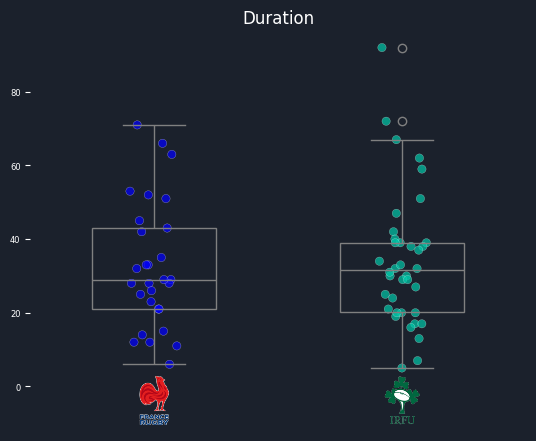

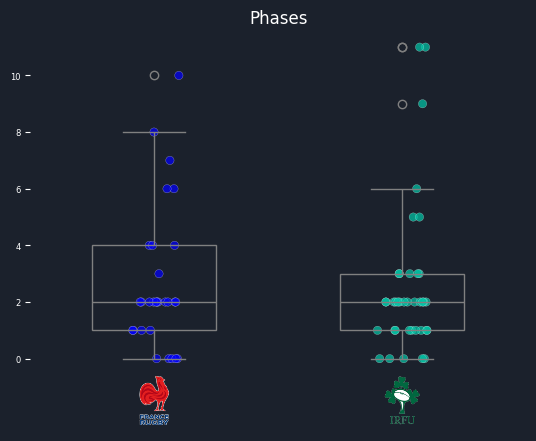

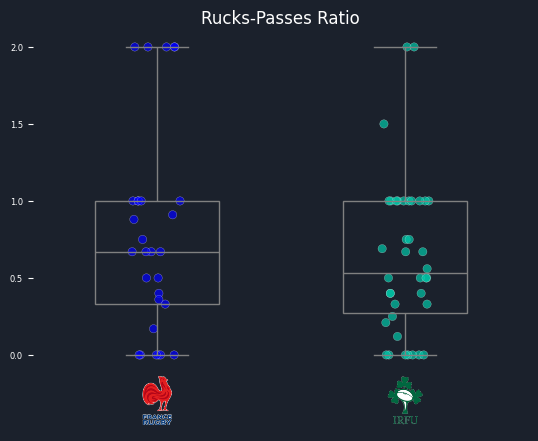

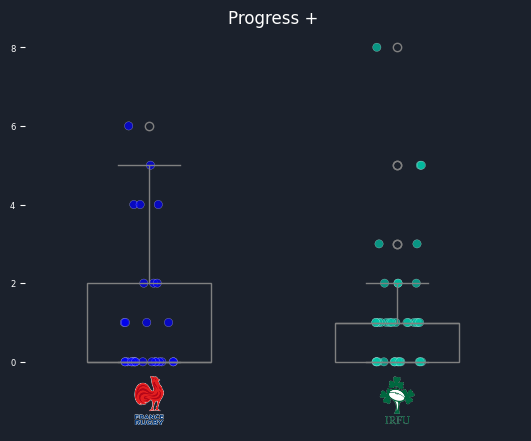

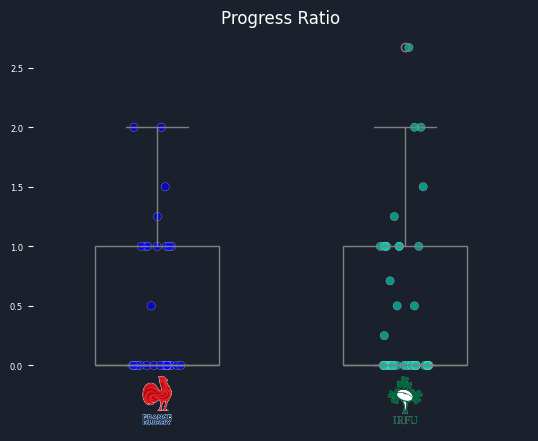

...

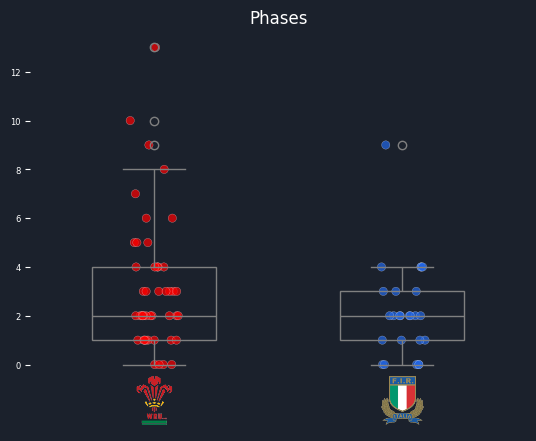

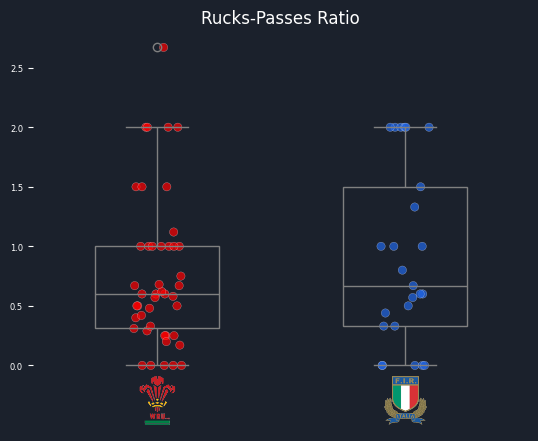

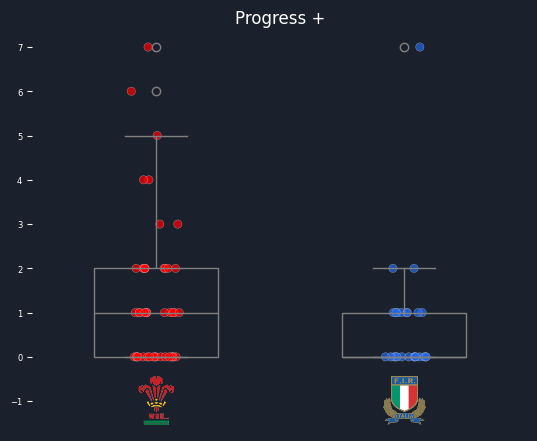

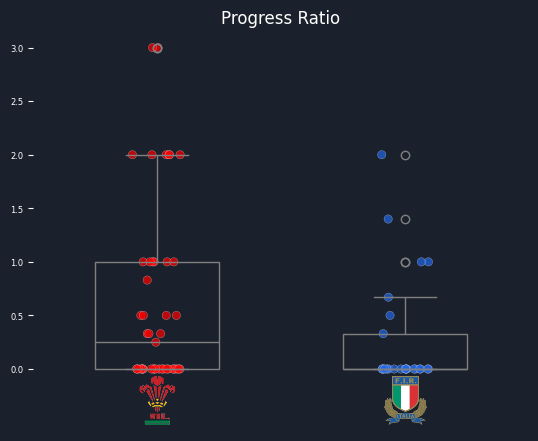

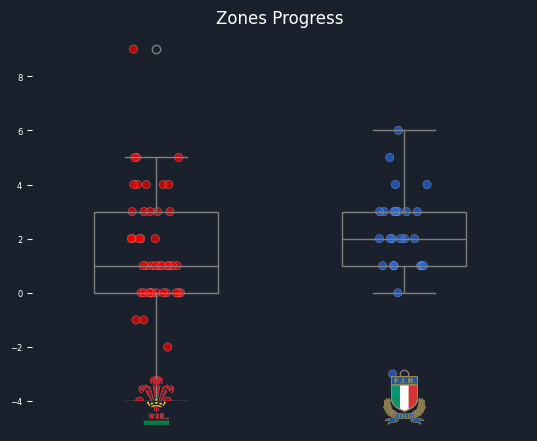

In [10]:
for g in data['Match'].unique():
    data_g = data[data['Match']==g].copy()
    order = [g.split(' - ')[0], g.split(' - ')[1]]
    colors = [teams_colors[g.split(' - ')[0]], teams_colors[g.split(' - ')[1]]]
    
    for metric, ylim in zip(['Duration', 'Phases', 'Rucks-Passes Ratio', 'Progress +', 'Progress Ratio', 'Zones Progress'],
                            [-4, -1.5, -.3, -1, -.3, -4]):
        fig, ax = plt.subplots(facecolor='#1B212C')
        PROPS = {'boxprops':{'facecolor':'none', 'edgecolor':'gray'},
                'medianprops':{'color':'gray'},
                'whiskerprops':{'color':'gray'},
                'capprops':{'color':'gray'}}
        sns.boxplot(data=data_g, x='Possession', hue='Possession', legend=False, y=metric, width=.5, ax=ax, **PROPS, flierprops={'markeredgecolor':'gray'}, order=order, hue_order=order)
        sns.stripplot(data=data_g, x='Possession', hue='Possession', legend=False, y=metric, palette=colors, size=6, zorder=1, ax=ax, order=order, hue_order=order, alpha=.7,
                      linewidth=.2, edgecolor='white')
        
        for i, t in enumerate(order):
            logo = imread(f'img/{t}.png')
            logobox = OffsetImage(logo, zoom=0.35)
            ab = AnnotationBbox(logobox, (i, ylim), frameon=False)
            ax.add_artist(ab)

        ax.set_facecolor('#1B212C')
        ax.tick_params(axis='y', colors='white')
        ax.set_ylim(ylim, None)
        ax.spines[:].set_visible(False)
        ax.set(xlabel=None, ylabel=None)
        plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
        plt.yticks(fontsize=6, color='white')
        plt.title(metric, color='white')
        plt.savefig(f'stat_boxplots/{g}_{metric}.png', bbox_inches='tight')

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\1759584664.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='#1B212C')


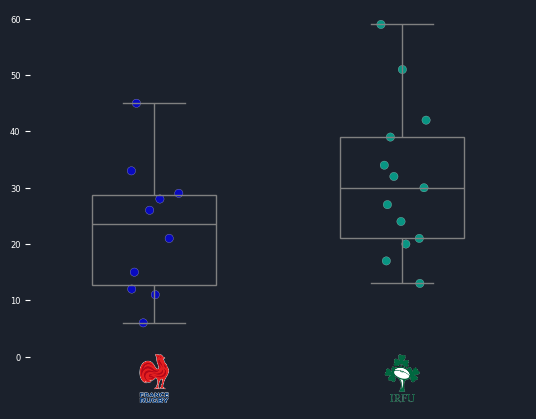

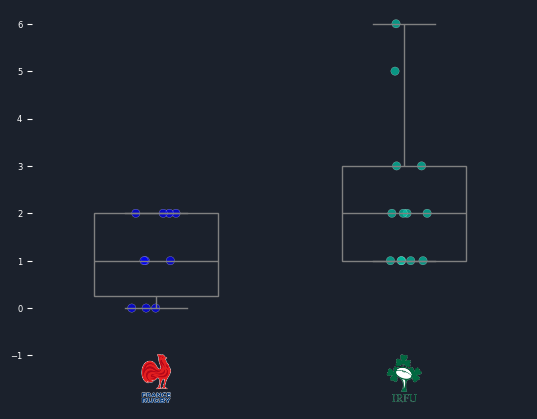

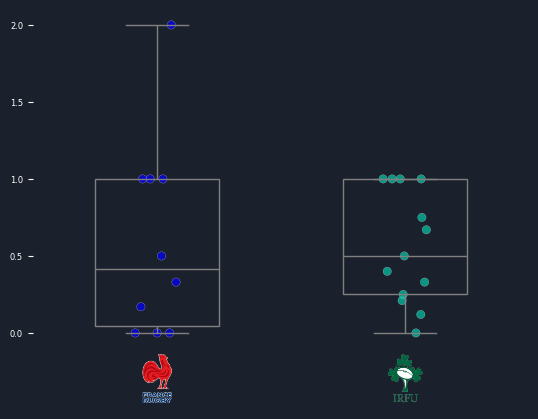

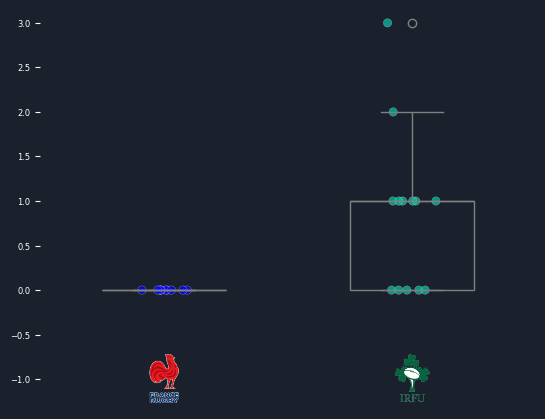

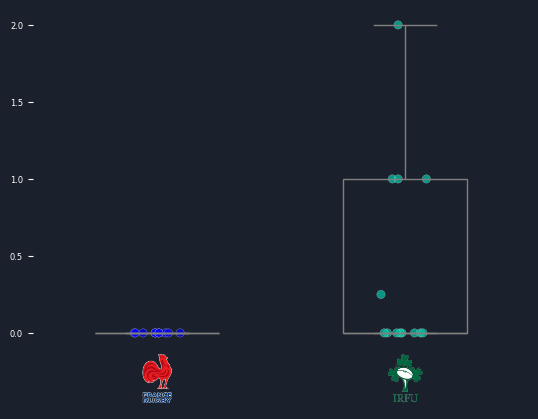

...

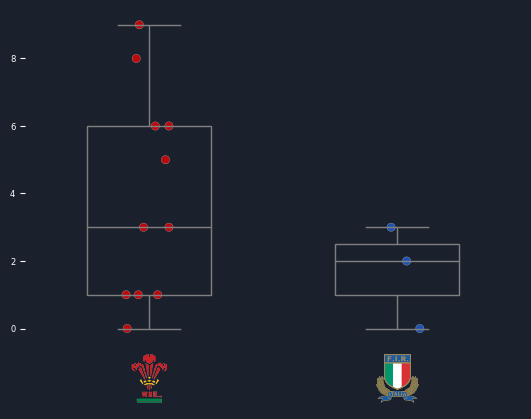

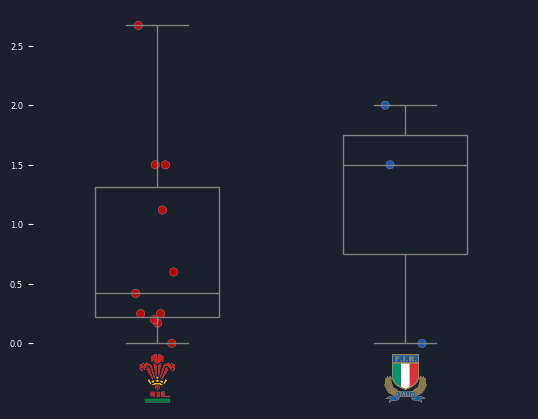

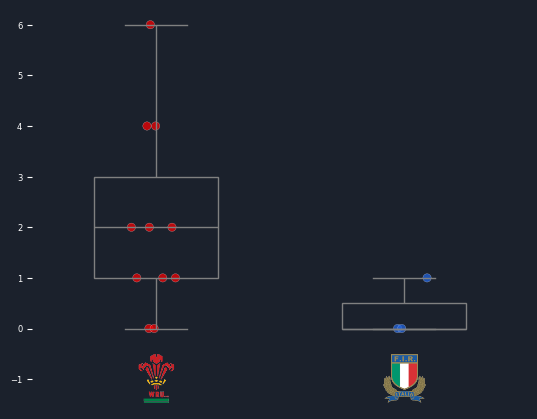

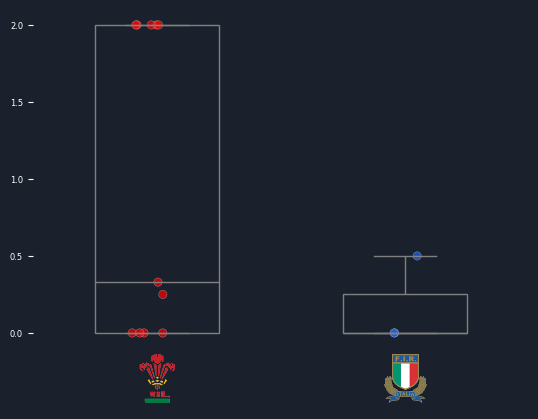

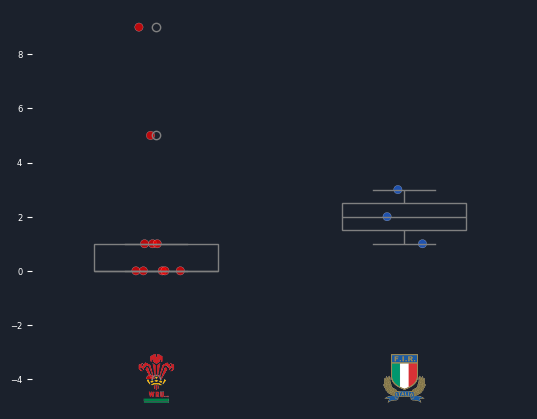

In [11]:
for g in data['Match'].unique():
    data_g = data[data['Match']==g].copy()
    order = [g.split(' - ')[0], g.split(' - ')[1]]
    colors = [teams_colors[g.split(' - ')[0]], teams_colors[g.split(' - ')[1]]]
    
    for c in data_g['Chrono'].unique():
        data_g_c = data_g[data_g['Chrono']==c].copy()
        for metric, ylim in zip(['Duration', 'Phases', 'Rucks-Passes Ratio', 'Progress +', 'Progress Ratio', 'Zones Progress'],
                                [-4, -1.5, -.3, -1, -.3, -4]):
            fig, ax = plt.subplots(facecolor='#1B212C')
            PROPS = {'boxprops':{'facecolor':'none', 'edgecolor':'gray'},
                    'medianprops':{'color':'gray'},
                    'whiskerprops':{'color':'gray'},
                    'capprops':{'color':'gray'}}
            sns.boxplot(data=data_g_c, x='Possession', hue='Possession', legend=False, y=metric, width=.5, ax=ax, **PROPS, flierprops={'markeredgecolor':'gray'}, order=order, hue_order=order)
            sns.stripplot(data=data_g_c, x='Possession', hue='Possession', legend=False, y=metric, palette=colors, size=6, zorder=1, ax=ax, order=order, hue_order=order, alpha=.7,
                        linewidth=.2, edgecolor='white')
            
            for i, t in enumerate(order):
                logo = imread(f'img/{t}.png')
                logobox = OffsetImage(logo, zoom=0.35)
                ab = AnnotationBbox(logobox, (i, ylim), frameon=False)
                ax.add_artist(ab)

            ax.set_facecolor('#1B212C')
            ax.tick_params(axis='y', colors='white')
            ax.set_ylim(ylim, None)
            ax.spines[:].set_visible(False)
            ax.set(xlabel=None, ylabel=None)
            plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
            plt.yticks(fontsize=6, color='white')
            plt.savefig(f'stat_boxplots_period/{g}_{c}_{metric}.png', bbox_inches='tight')

# Boxplots ANOVA

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\194302039.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='#1B212C')


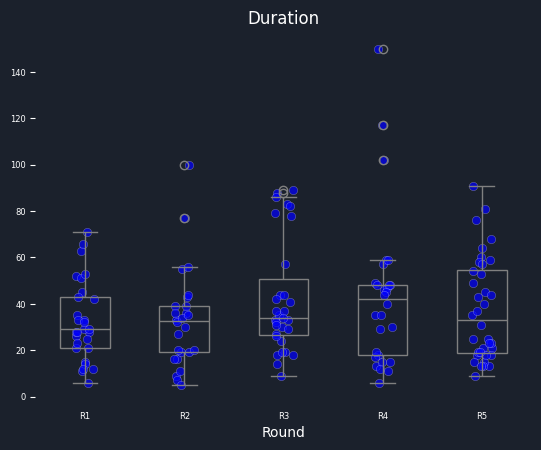

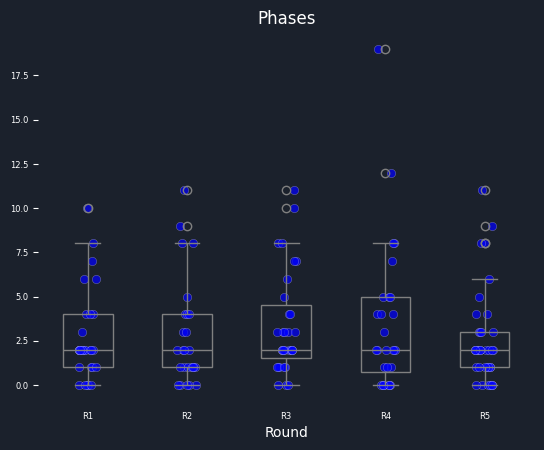

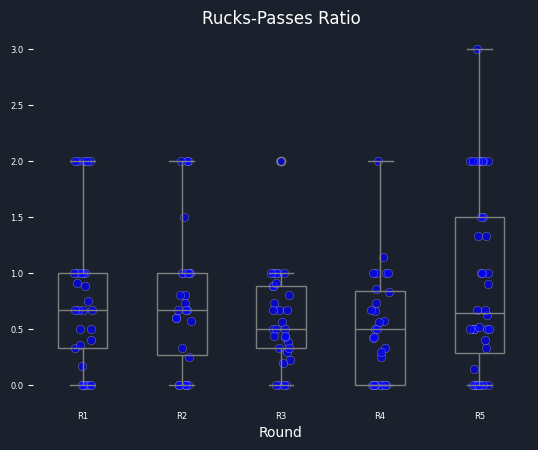

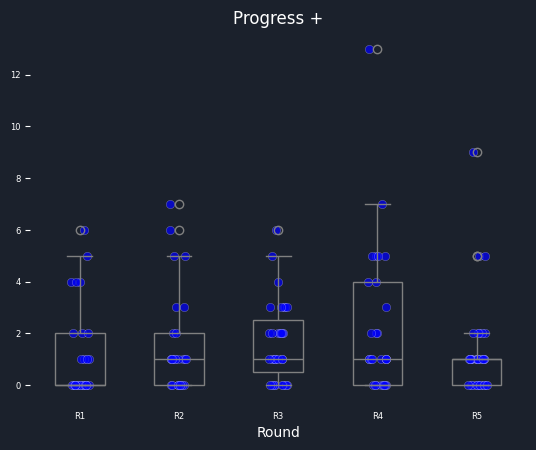

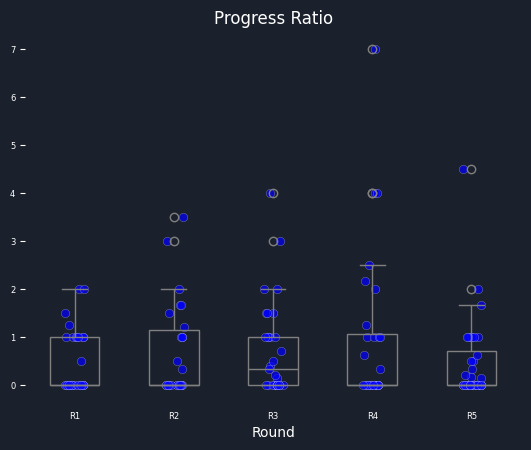

...

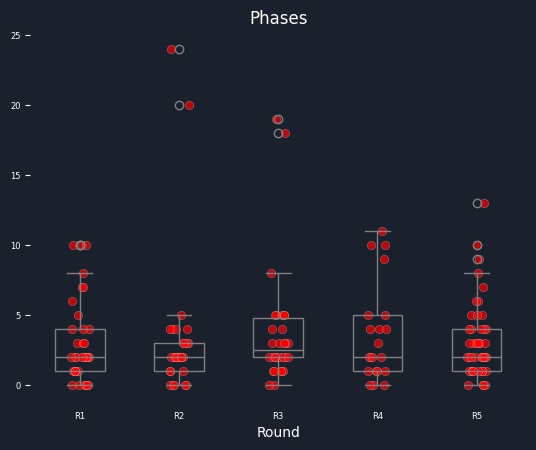

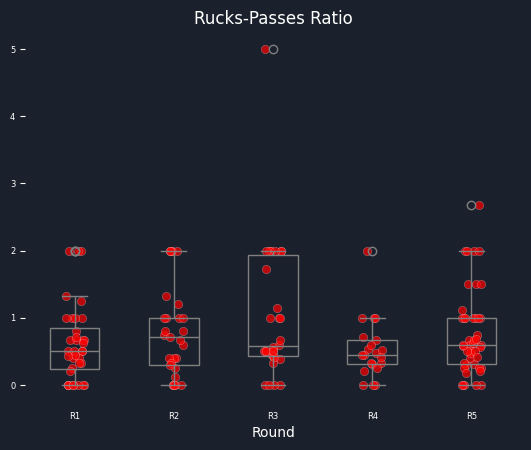

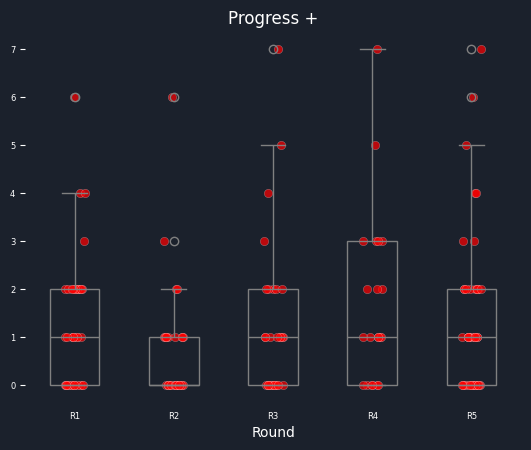

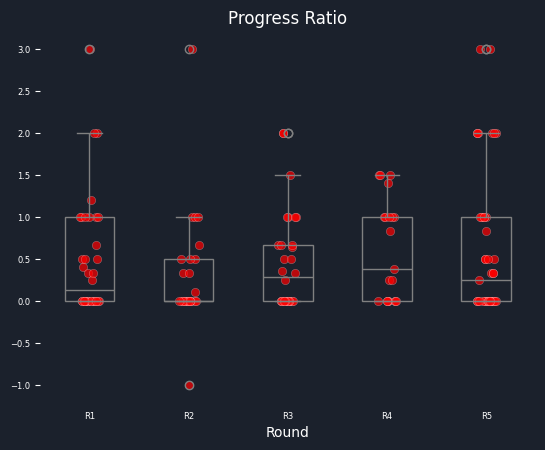

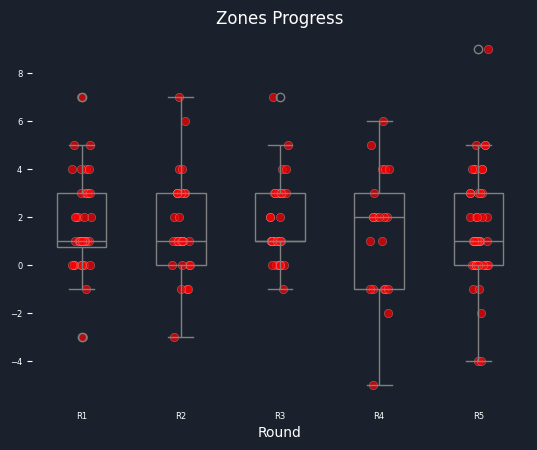

In [12]:
order = ['R1', 'R2', 'R3', 'R4', 'R5']

for t in data['Possession'].unique():
    data_t = data[data['Possession'].str.contains(t)].copy()

    for metric in ['Duration', 'Phases', 'Rucks-Passes Ratio', 'Progress +', 'Progress Ratio', 'Zones Progress']:
        fig, ax = plt.subplots(facecolor='#1B212C')
        PROPS = {'boxprops':{'facecolor':'none', 'edgecolor':'gray'},
                'medianprops':{'color':'gray'},
                'whiskerprops':{'color':'gray'},
                'capprops':{'color':'gray'}}
        sns.boxplot(data=data_t, x='Round', y=metric, order=order, width=.5, ax=ax, **PROPS, flierprops={'markeredgecolor':'gray'})
        sns.stripplot(data=data_t, x='Round', y=metric, order=order, color=teams_colors[t], legend=False, size=6, zorder=1, ax=ax, alpha=.7,
                      linewidth=.2, edgecolor='white')
        ax.set_facecolor('#1B212C')
        ax.tick_params(axis='y', colors='white')
        ax.spines[:].set_visible(False)
        ax.set(ylabel=None)
        ax.xaxis.label.set_color('white')
        plt.xticks(fontsize=6, color='white')
        plt.yticks(fontsize=6, color='white')
        plt.title(metric, color='white')
        plt.tick_params(axis='x', bottom=False, top=False)
        plt.savefig(f'stat_anova_game/{t}_{metric}.png', bbox_inches='tight')

C:\Users\raflg\AppData\Local\Temp\ipykernel_16268\1682611563.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(facecolor='#1B212C')


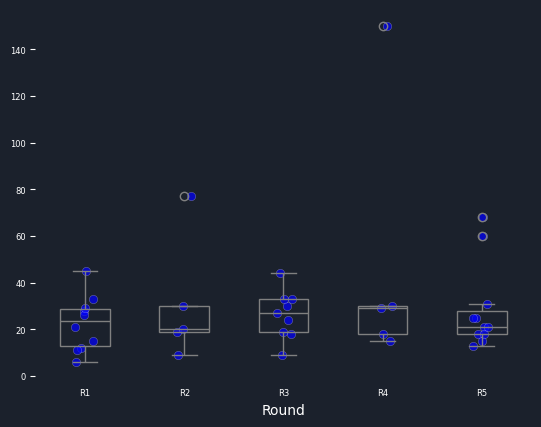

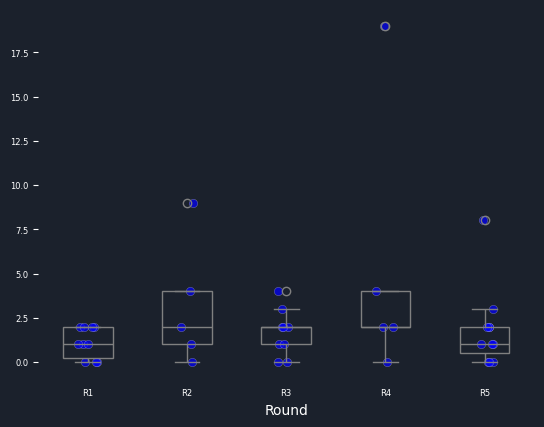

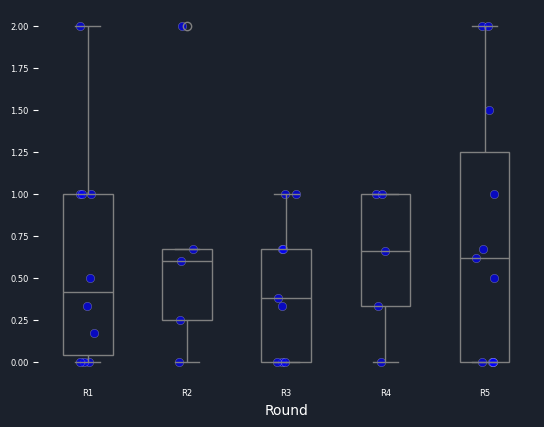

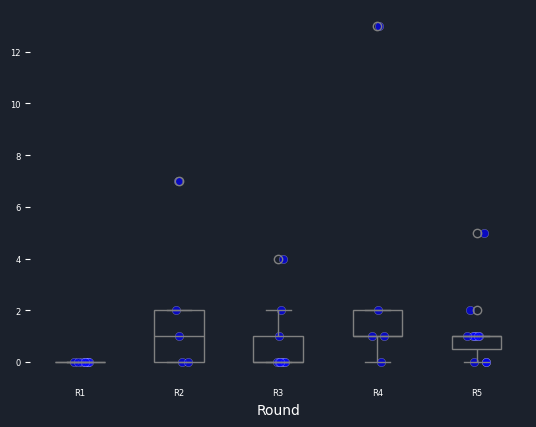

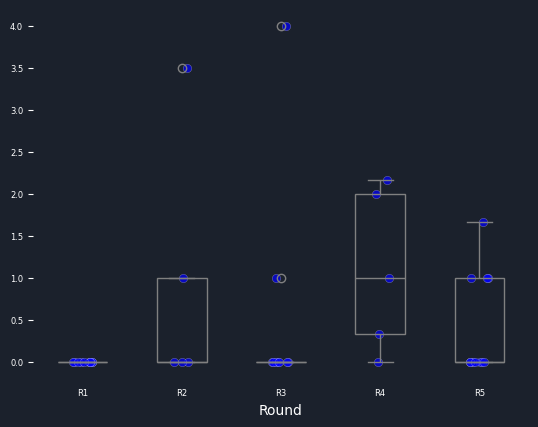

...

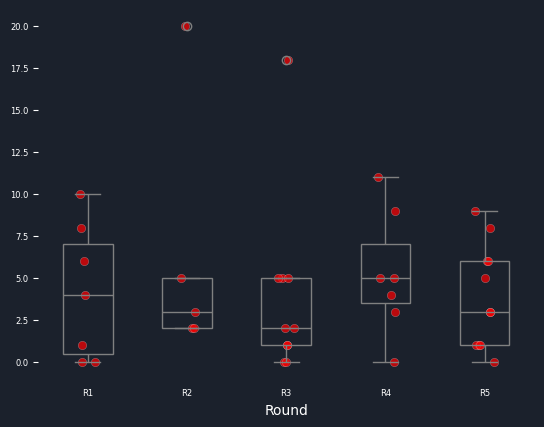

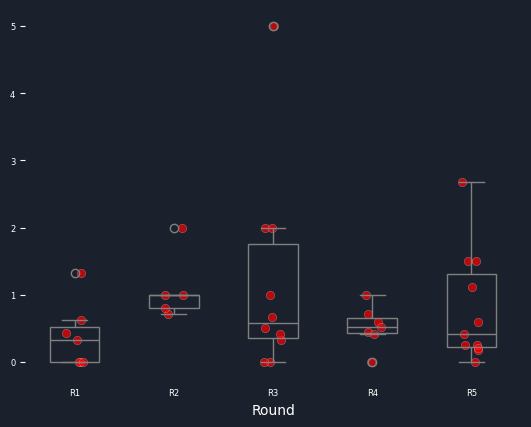

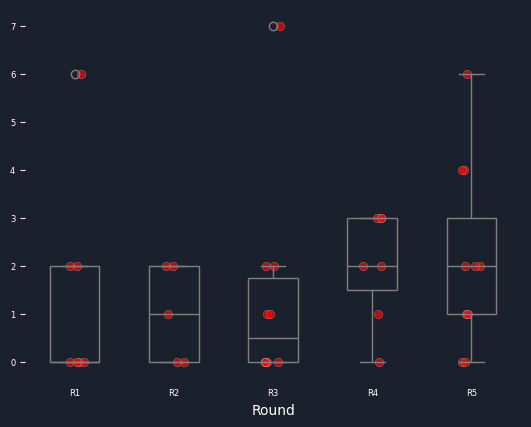

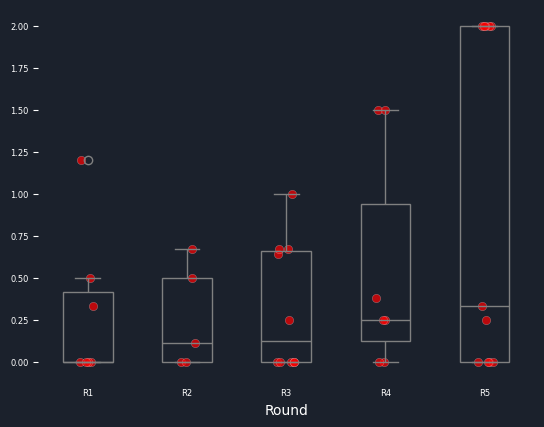

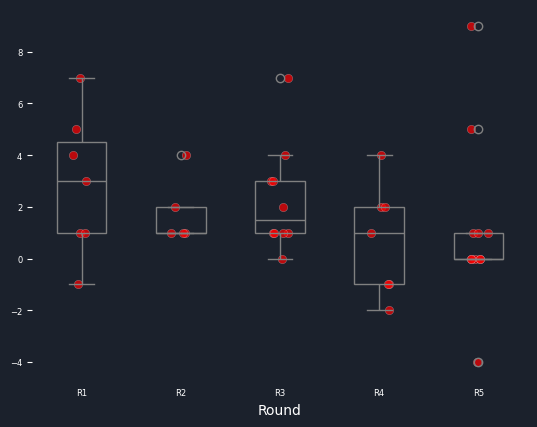

In [13]:
order = ['R1', 'R2', 'R3', 'R4', 'R5']

for t in data['Possession'].unique():
    data_t = data[data['Possession'].str.contains(t)].copy()
    for c in data_t['Chrono'].unique():
        data_t_c = data_t[data_t['Chrono']==c].copy()
        for metric in ['Duration', 'Phases', 'Rucks-Passes Ratio', 'Progress +', 'Progress Ratio', 'Zones Progress']:
            fig, ax = plt.subplots(facecolor='#1B212C')
            PROPS = {'boxprops':{'facecolor':'none', 'edgecolor':'gray'},
                     'medianprops':{'color':'gray'},
                     'whiskerprops':{'color':'gray'},
                     'capprops':{'color':'gray'}}
            sns.boxplot(data=data_t_c, x='Round', y=metric, order=order, width=.5, ax=ax, **PROPS, flierprops={'markeredgecolor':'gray'})
            sns.stripplot(data=data_t_c, x='Round', y=metric, order=order, color=teams_colors[t], legend=False, size=6, zorder=1, ax=ax, alpha=.7,
                          linewidth=.2, edgecolor='white')
            ax.set_facecolor('#1B212C')
            ax.tick_params(axis='y', colors='white')
            ax.spines[:].set_visible(False)
            ax.set(ylabel=None)
            ax.xaxis.label.set_color('white')
            plt.xticks(fontsize=6, color='white')
            plt.yticks(fontsize=6, color='white')
            plt.tick_params(axis='x', bottom=False, top=False)
            plt.savefig(f'stat_anova_period/{t}_{c}_{metric}.png', bbox_inches='tight')